In [1]:
#General packages
from IPython.display import clear_output #import of a single funtcion
import sys #system related packages
import os #better path and file handling
import pickle #saving and loading objects

#Tables, numbers etc
import pandas as pd #tables
import numpy as np #arrays
import scipy #sciency functions
from sklearn import mixture #For gaussian mixture model

#Plotting packages
import matplotlib.pyplot as plt #Main plotting
from matplotlib.ticker import MaxNLocator
from matplotlib.lines import Line2D
import seaborn as sbn #nicer plots

#RNA-seq analysis
import scanpy as sc #Main package for scRNA-seq analysis
import scanpy.external as sce #some more functions for scanpy
import bbknn #batch correction

import colorsys

#Import some custom helper functions for plotting
path_skin_scripts = '/mnt/p/users/Karl/Python/Projects'
sys.path.append(path_skin_scripts)
from Skin_scripts import *

import warnings
warnings.simplefilter("ignore")

# Read in Muzz data

In [23]:
path = '/mnt/p/IMPORTANT-Backup-Sequencing-Projects/2024_Hao_HSCA_Integration_datasets'
muzz_data = sc.read_h5ad(os.path.join(path, 'Skin fibroblast scRNA-seq atlas in health.h5ad'))
muzz_data

AnnData object with n_obs × n_vars = 153546 × 36601
    obs: 'Site_status', 'Patient_status', 'assay', 'organism', 'tissue', 'disease', 'cell_type', 'disease_category', 'organism_ontology_term_id', 'tissue_ontology_term_id', 'cell_type--cell_fullname', 'cell_type--cell_ontology_term_id', 'cell_type--cell_ontology_term', 'cell_type--synonyms', 'assay_ontology_term_id', 'disease_ontology_term_id', 'cell_type--rationale', 'cell_type--rationale_dois', 'cell_type--marker_gene_evidence', 'cell_type--canonical_marker_genes', 'cell_type--category_fullname', 'cell_type--category_cell_ontology_exists', 'cell_type--category_cell_ontology_term_id', 'cell_type--category_cell_ontology_term'
    var: 'gene_names'
    uns: 'authors_list', 'cap_dataset_url', 'cap_publication_description', 'cap_publication_title', 'cap_publication_url', 'cell_type_colors', 'cellannotation_metadata', 'cellannotation_schema_version', 'description', 'publication_timestamp', 'publication_version', 'title'
    obsm: 'X_umap'

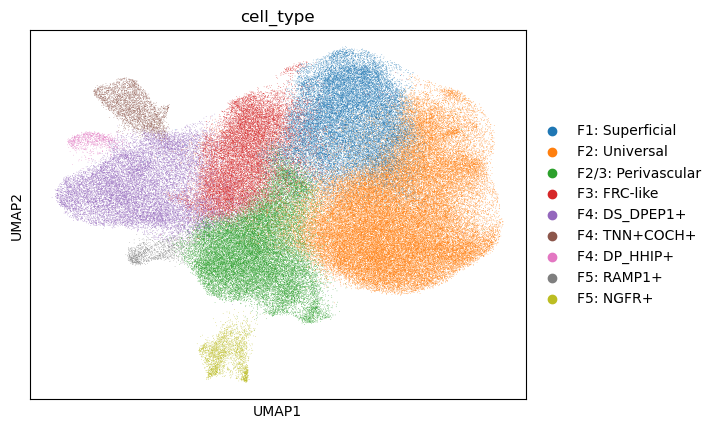

In [25]:
sc.pl.umap(muzz_data, color = 'cell_type')

In [38]:
muzz_data.layers['raw_counts'] = muzz_data.raw[muzz_data.obs_names][:, muzz_data.var_names].X.copy()

In [39]:
muzz_data.layers['counts'] = muzz_data.X.copy()

# Read fibroblast data

In [7]:
path = convert_path(r'P:\IMPORTANT-Backup-Sequencing-Projects\2024_Hao_HSCA_Integration_datasets\dataset\iHSCA_20251110')
fib_data = sc.read_h5ad(os.path.join(path, 'Fibroblast_IntegratedAnnotation_2_20250531.h5ad'))
fib_data

AnnData object with n_obs × n_vars = 67229 × 75464
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Ambiguity', 'Exon', 'Intergenic', 'Intron', 'Unmapped', 'plateID', 'indices', 'WellID', 'donor', 'group', 'bodysite', 'nReads', 'rRNA', 'pct_exon', 'ProtocolTissueDissociation', 'PlateID', 'n_genes', 'pct_counts_rRNA', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'merge_by', 'S_score', 'G2M_score', 'phase', 'leiden_1_001', 'leiden_1_002', 'leiden_1_003', 'leiden_1_005', 'leiden_1_008', 'leiden_1_010', 'leiden_1_012', 'leiden_1_015', 'leiden_1_020', 'leiden_1_030', 'leiden_1_050', 'leiden_1_080', 'leiden_1_100', 'leiden_1_120', 'leiden_1_150', 'leiden_1_200', 'leiden_1_300', 'select', 'leiden_1', 'Y_X_ratio', 'percent.mt', 'Patient', '_UMAP1', '_UMAP2', '_tSNE1', '_tSNE2', 'DonorID_short', 'Age', 'Sex', 'Ethnicity1', 'SubjectType', 'SampleID', 'SampleType', 'SampledSiteCondition', 'Tissue', 'LibraryPlatform', 'StrandSequence', 'SequencingPlatform', 'Refere

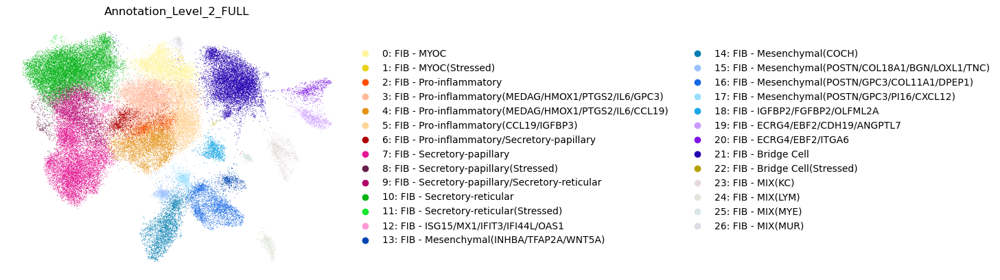

In [16]:
sc.pl.embedding(fib_data, basis = 'umap_2_imbalance', color = 'Annotation_Level_2_FULL', palette = cmap_full, frameon = False)

# Merged data

In [42]:
path = convert_path(r'P:\IMPORTANT-Backup-Sequencing-Projects\2024_Hao_HSCA_Integration_datasets\Additional_datasets\v70_H_SH')
file = 'adata_all_20260302.h5ad'
adata = sc.read_h5ad(os.path.join(path, file))
adata

AnnData object with n_obs × n_vars = 220775 × 36601
    obs: 'study_id', 'experiment_id', 'institute', 'author_batch_notes', 'organism', 'organism_ontology_term_id', 'donor_id', 'donor_id_running', 'sex_ontology_term', 'sex_ontology_term_id', 'ethnicity_1', 'ethnicity_2', 'ethnicity_details', 'self_reported_ethnicity_ontology_term_id', 'genotype', 'age_years', 'age_range', 'development_stage_ontology_term', 'development_stage_ontology_term_id', 'disease', 'disease_ontology_term_id', 'disease_status', 'treatment_status', 'smoking_status', 'smoking_history', 'bmi', 'systemic_disorder', 'autoimmune_component', 'menopause_status', 'puperty_status', 'sun_exposure', 'skin_tone', 'skin_care', 'manner_of_death', 'sample_id', 'sample_id_running', 'sample_source', 'sample_collection_method', 'sampled_site_condition', 'anatomical_region_level_1', 'anatomical_region_level_2', 'anatomical_region_level_3', 'anatomical_region', 'tissue_type', 'tissue_free_text', 'tissue_ontology_term', 'tissue_ontolo

In [12]:
fib_colormap={'0': colorsys.hsv_to_rgb(0.15, 0.4, 1),
                           '1': colorsys.hsv_to_rgb(0.15, 0.9, 0.9),
                           '2': colorsys.hsv_to_rgb(0.05, 1, 1),
                           '3': colorsys.hsv_to_rgb(0.05, 0.4, 1),
                           '4': colorsys.hsv_to_rgb(0.1, 0.9, 0.9),
                           '5': colorsys.hsv_to_rgb(0.1, 0.4, 1),
                           '6': colorsys.hsv_to_rgb(0.0, 1, 0.7),
                           '7': colorsys.hsv_to_rgb(0.9, 0.9, 0.9),
                           '8': colorsys.hsv_to_rgb(0.9, 0.7, 0.4),
                           '9': colorsys.hsv_to_rgb(0.9, 1, 0.7),
                           '10': colorsys.hsv_to_rgb(0.35, 1, 0.7),
                           '11': colorsys.hsv_to_rgb(0.35, 0.9, 0.9),
                           '12': colorsys.hsv_to_rgb(0.9, 0.4, 1),
                           '13': colorsys.hsv_to_rgb(0.6, 1, 0.7),
                           '14': colorsys.hsv_to_rgb(0.55, 1, 0.7),
                           '15': colorsys.hsv_to_rgb(0.6, 0.4, 1),
                           '16': colorsys.hsv_to_rgb(0.6, 0.9, 0.9),
                           '17': colorsys.hsv_to_rgb(0.55, 0.4, 1),
                           '18': colorsys.hsv_to_rgb(0.55, 0.9, 0.9),
                           '19': colorsys.hsv_to_rgb(0.75, 0.4, 1),
                           '20': colorsys.hsv_to_rgb(0.75, 0.9, 0.9),
                           '21': colorsys.hsv_to_rgb(0.7, 1, 0.7),
                           '22': colorsys.hsv_to_rgb(0.15, 1, 0.7),
                           '23': colorsys.hsv_to_rgb(0, 0.05, 0.9),
                           '24': colorsys.hsv_to_rgb(0.25, 0.05, 0.9),
                           '25': colorsys.hsv_to_rgb(0.5, 0.05, 0.9),
                           '26': colorsys.hsv_to_rgb(0.75, 0.05, 0.9)
                          }
cmap_full = {cl: fib_colormap[cl.split(':')[0].split(' - ')[-1]] for cl in adata.obs['integrated_annotation_L2'].unique() if isinstance(cl, str)}

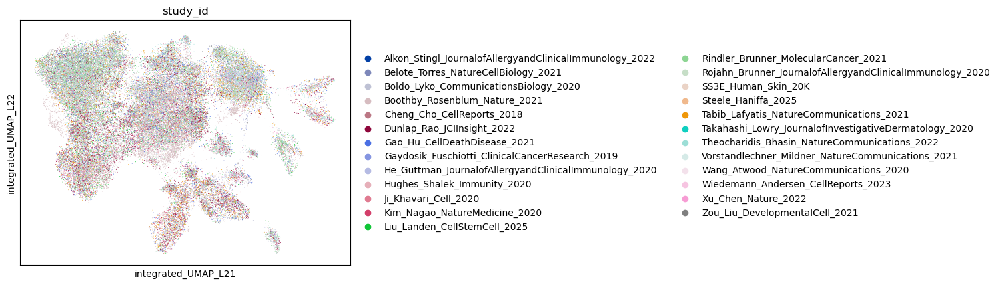

In [252]:
basis = 'integrated_UMAP_L2'
sc.pl.embedding(adata, basis = basis, color = 'study_id', s = 2)

In [64]:
adata.obs['study_id'].unique()

['SS3E_Human_Skin_20K', 'Liu_Landen_CellStemCell_2025', 'Gaydosik_Fuschiotti_ClinicalCancerResearch_2019', 'Wang_Atwood_NatureCommunications_2020', 'Takahashi_Lowry_JournalofInvestigativeDermato..., ..., 'Rojahn_Brunner_JournalofAllergyandClinicalImm..., 'Theocharidis_Bhasin_NatureCommunications_2022', 'Vorstandlechner_Mildner_NatureCommunications_..., 'Xu_Chen_Nature_2022', 'Steele_Haniffa_2025']
Length: 25
Categories (25, object): ['Alkon_Stingl_JournalofAllergyandClinicalImmun..., 'Belote_Torres_NatureCellBiology_2021', 'Boldo_Lyko_CommunicationsBiology_2020', 'Boothby_Rosenblum_Nature_2021', ..., 'Wang_Atwood_NatureCommunications_2020', 'Wiedemann_Andersen_CellReports_2023', 'Xu_Chen_Nature_2022', 'Zou_Liu_DevelopmentalCell_2021']

In [55]:
adata.obs = adata.obs.replace('nan', pd.NA)
adata.obs['H_to_SH_full'] = adata.obs['H_to_SH'].fillna(adata.obs['cell_type'])
adata.obs['SH_to_H_full'] = adata.obs['SH_to_H'].fillna(adata.obs['integrated_annotation_L2'])

# Redo ingest

In [221]:
adata_ref = adata[adata.obs['study_id']!='Steele_Haniffa_2025'].copy()
adata_que = adata[adata.obs['study_id']=='Steele_Haniffa_2025'].copy()

In [222]:
sc.pp.neighbors(adata_ref, use_rep='PCA_all')
sc.pp.neighbors(adata_que, use_rep='PCA_all')

In [228]:
sc.pp.pca(adata_que)
sc.pp.pca(adata_ref)

In [317]:
adata_ref.obsm['X_umap'] = adata_ref.obsm['integrated_UMAP_L2'].copy()
adata_ref.obsm['X_pca'] = adata_ref.obsm['PCA_all'].copy()
adata_que.obsm['X_pca'] = adata_que.obsm['PCA_all'].copy()

## Map SH cells to get cluster identities and UMAP from Hao's data

In [318]:
sc.tl.ingest(adata_que, adata_ref, obs = 'integrated_annotation_L2')

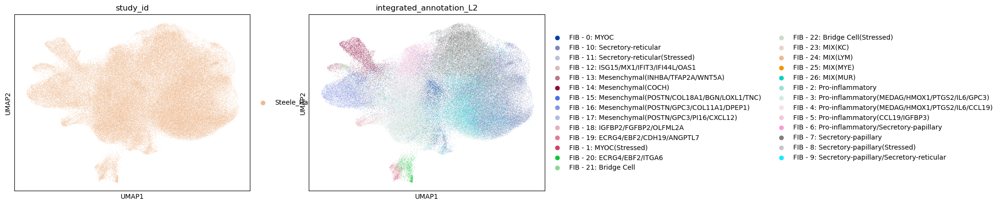

In [341]:
sc.pl.embedding(adata_que, color = ['study_id', 'integrated_annotation_L2'])

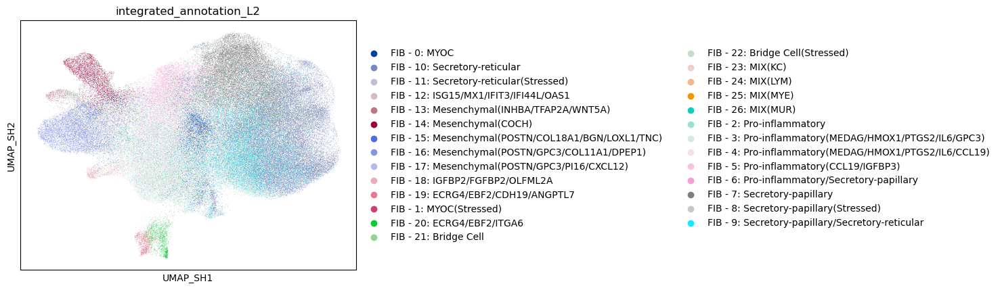

In [320]:
sc.pl.embedding(adata_que, basis = 'UMAP_SH', color = 'integrated_annotation_L2')

In [321]:
adata.obs['ingest_SH_to_H'] = adata.obs['integrated_annotation_L2'].copy()
adata.obs['ingest_SH_to_H'] = adata.obs['ingest_SH_to_H'].fillna(adata_que.obs['integrated_annotation_L2'])

In [322]:
adata.obsm['UMAP_ingest_H'] = adata.obsm['integrated_UMAP_L2'].copy()

adata.obsm['UMAP_ingest_H'][
    adata.obs_names.get_indexer(adata_que.obs_names)
] = adata_que.obsm['X_umap']

## Map Hao cells to get cluster identities and UMAP from SH data

In [332]:
adata_que.obsm['X_umap'] = adata_que.obsm['UMAP_SH'].copy()

In [333]:
sc.tl.ingest(adata_ref, adata_que, obs = 'cell_type')

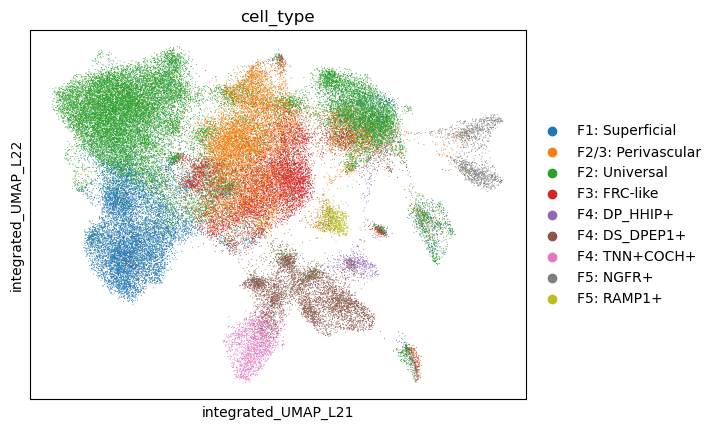

In [334]:
sc.pl.embedding(adata_ref, color = 'cell_type', basis = 'integrated_UMAP_L2')

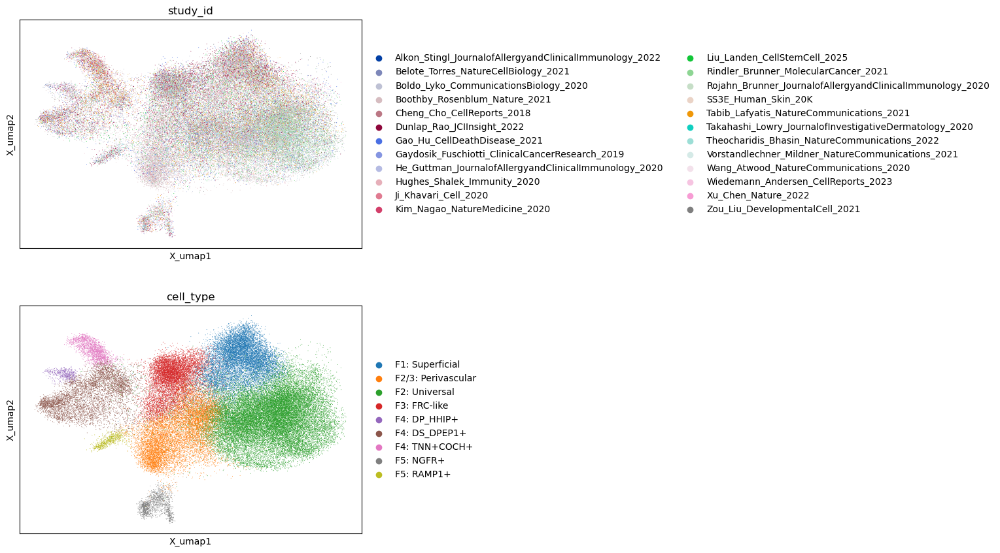

In [343]:
sc.pl.embedding(adata_ref, basis = 'X_umap', color = ['study_id', 'cell_type'], ncols = 1)

In [336]:
adata.obs['ingest_H_to_SH'] = adata.obs['cell_type'].copy()
adata.obs['ingest_H_to_SH'] = adata.obs['ingest_H_to_SH'].fillna(adata_ref.obs['cell_type'])

In [337]:
adata.obsm['UMAP_ingest_SH'] = adata.obsm['UMAP_SH'].copy()

adata.obsm['UMAP_ingest_SH'][
    adata.obs_names.get_indexer(adata_ref.obs_names)
] = adata_ref.obsm['X_umap']

<Axes: title={'center': 'ingest_H_to_SH'}, xlabel='UMAP_ingest_H1', ylabel='UMAP_ingest_H2'>

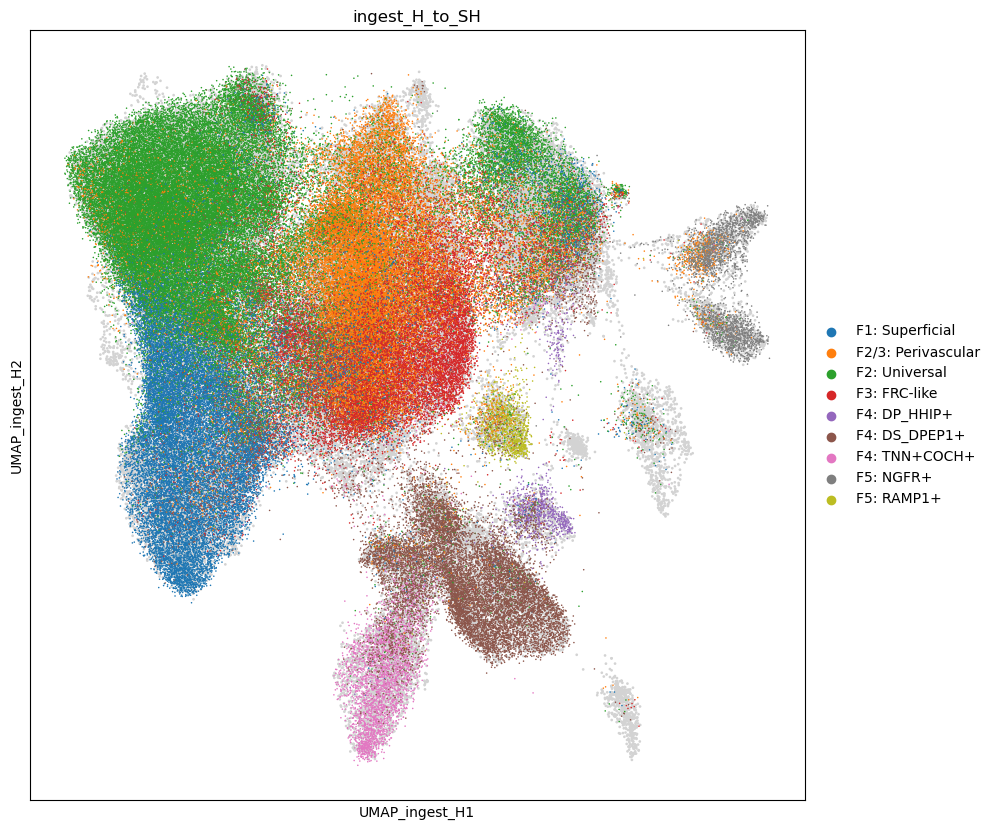

In [338]:
fig, ax = plt.subplots(figsize = (10, 10))
basis = 'UMAP_ingest_H'
sc.pl.embedding(adata[adata.obs['study_id']!='Steele_Haniffa_2025'], basis = basis, s = 15, ax = ax, show = False)
sc.pl.embedding(adata[adata.obs['study_id']=='Steele_Haniffa_2025'], basis = basis, color = 'ingest_H_to_SH', s = 5, ax = ax, show = False)

<Axes: title={'center': 'ingest_SH_to_H'}, xlabel='UMAP_ingest_H1', ylabel='UMAP_ingest_H2'>

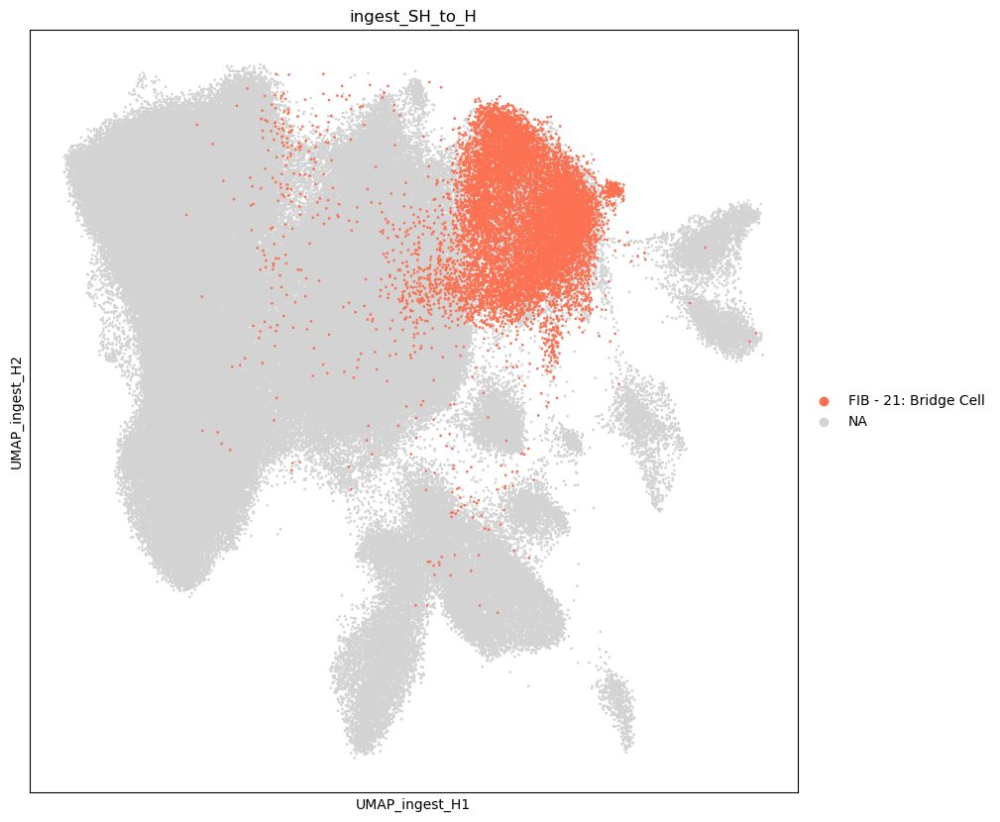

In [339]:
fig, ax = plt.subplots(figsize = (10, 10))
basis = 'UMAP_ingest_H'
sc.pl.embedding(adata[adata.obs['study_id']!='Steele_Haniffa_2025'], basis = basis, s = 15, ax = ax, show = False)
sc.pl.embedding(adata[adata.obs['study_id']=='Steele_Haniffa_2025'], basis = basis, color = 'ingest_SH_to_H', s = 15, ax = ax, show = False, groups = ['FIB - 21: Bridge Cell'], palette = 'Reds')

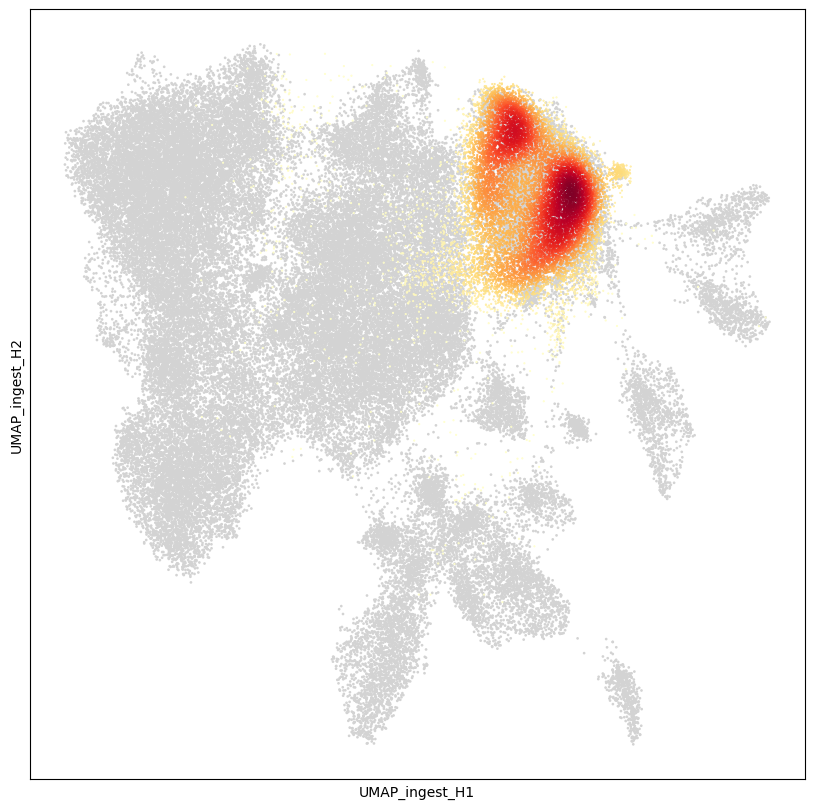

In [340]:
fig, ax = plt.subplots(figsize = (10, 10))
basis = 'UMAP_ingest_H'
sc.pl.embedding(adata[adata.obs['study_id']!='Steele_Haniffa_2025'], basis = basis, s = 15, ax = ax, show = False)
#sc.pl.embedding(adata[adata.obs['study_id']=='Steele_Haniffa_2025'], basis = basis, color = 'ingest_SH_to_H', s = 15, ax = ax, show = False, groups = ['FIB - 21: Bridge Cell'], palette = 'Reds')
cells = adata[(adata.obs['study_id']=='Steele_Haniffa_2025') & (adata.obs['ingest_SH_to_H'] == 'FIB - 21: Bridge Cell')].obs_names
x, y = adata[cells].obsm[basis].T
#z = calc_density(x, y)
ax.scatter(x, y, c = z, s = 0.3, cmap = 'YlOrRd')

<Axes: title={'center': 'SH_to_H'}, xlabel='UMAP_ingest_H1', ylabel='UMAP_ingest_H2'>

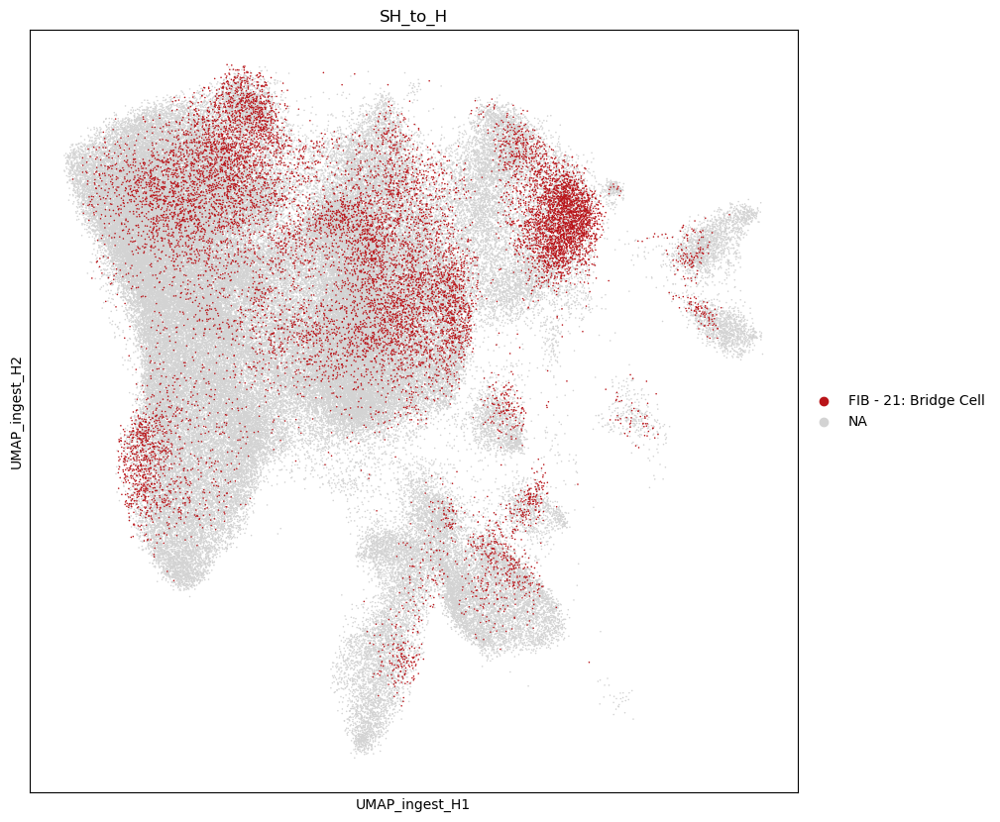

In [272]:
fig, ax = plt.subplots(figsize = (10, 10))
basis = 'UMAP_ingest_H'
sc.pl.embedding(adata[adata.obs['study_id']!='Steele_Haniffa_2025'], basis = basis, s = 15, ax = ax, show = False)
sc.pl.embedding(adata[adata.obs['study_id']=='Steele_Haniffa_2025'], basis = basis, color = 'SH_to_H', s = 15, ax = ax, show = False, groups = ['FIB - 21: Bridge Cell'], palette = 'Reds')

# Check results

In [344]:
for col in ['ingest_SH_to_H', 'ingest_H_to_SH']:
    new_cats = natsorted(adata.obs[col].astype(str).unique())
    adata.obs[col] = pd.Categorical(adata.obs[col], categories=new_cats, ordered=True)

In [370]:
fig_path = convert_path(r'P:\users\Hao\iHSCA_manuscript\Figure_items\Map_Steele_Fibroblasts')

## Fig S3d

[None, None]

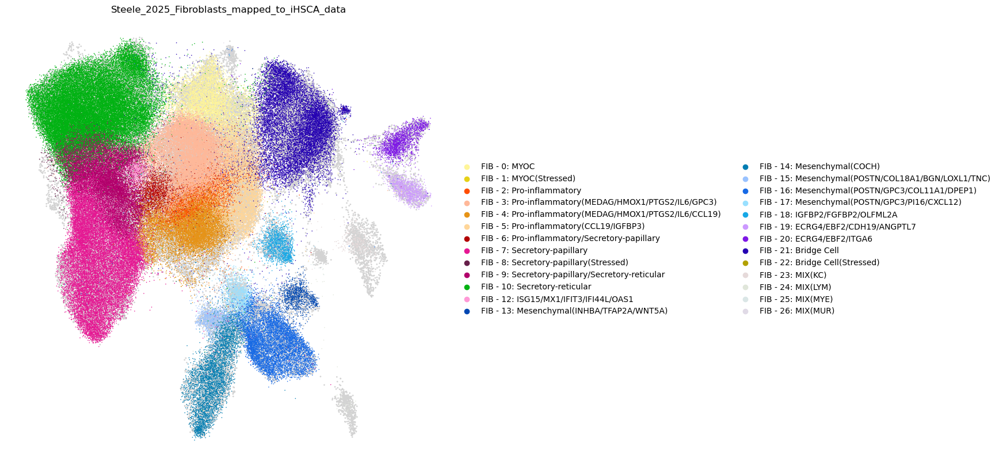

In [372]:
fig, ax = plt.subplots(figsize = (10, 10))
filename = 'Steele_2025_Fibroblasts_mapped_to_iHSCA_data'
basis = 'UMAP_ingest_H'
sc.pl.embedding(adata[adata.obs['study_id']!='Steele_Haniffa_2025'], basis = basis, s = 15, ax = ax, show = False)
sc.pl.embedding(adata[adata.obs['study_id']=='Steele_Haniffa_2025'], basis = basis, color = 'ingest_SH_to_H', s = 5, ax = ax, show = False, title = 'Steele_2025_Fibroblasts_mapped_to_iHSCA_data', palette = cmap_full, frameon = False)

[fig.savefig(os.path.join(os.path.join(fig_path, f'{filename}.{f}')), bbox_inches = 'tight', dpi = 600) for f in ['pdf', 'png']]

[None, None]

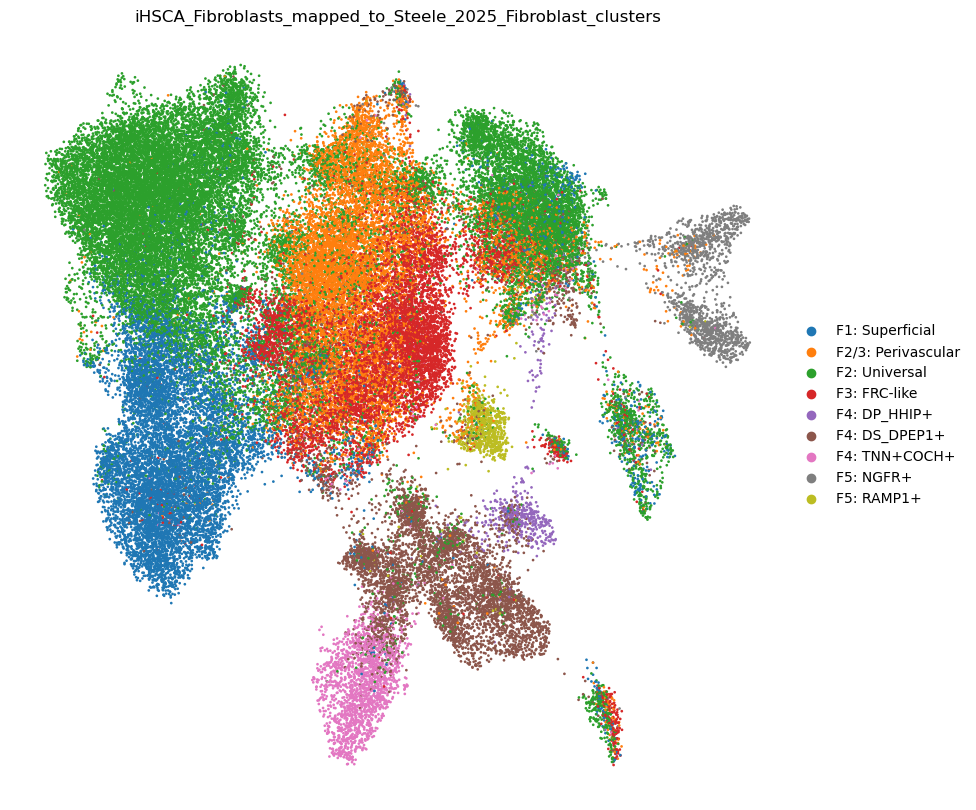

In [374]:
fig, ax = plt.subplots(figsize = (10, 10))
filename = 'iHSCA_Fibroblasts_mapped_to_Steele_2025_Fibroblast_clusters'
basis = 'UMAP_ingest_H'
sc.pl.embedding(adata[adata.obs['study_id']!='Steele_Haniffa_2025'], basis = basis, s = 15, ax = ax, show = False, color = 'ingest_H_to_SH', frameon = False, title = filename)
#sc.pl.embedding(adata[adata.obs['study_id']=='Steele_Haniffa_2025'], basis = basis, color = 'ingest_SH_to_H', s = 5, ax = ax, show = False, title = 'Steele_2025_Fibroblasts_mapped_to_iHSCA_data', palette = cmap_full, frameon = False)

[fig.savefig(os.path.join(os.path.join(fig_path, f'{filename}.{f}')), bbox_inches = 'tight', dpi = 600) for f in ['pdf', 'png']]

## Fig S3d

[None, None]

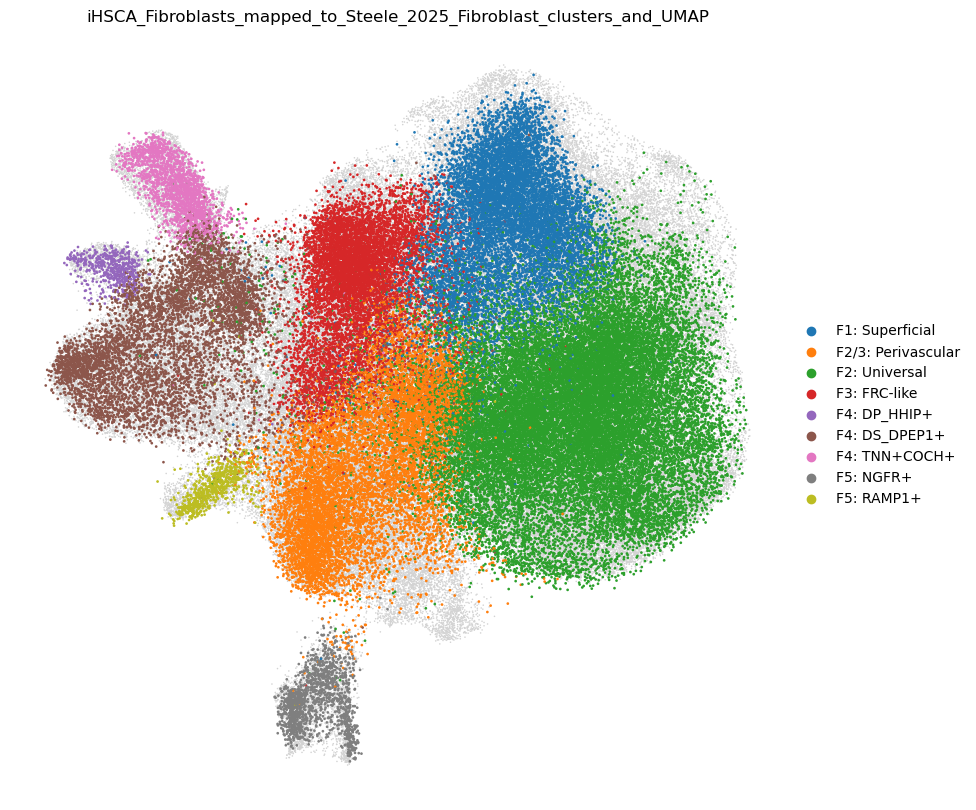

In [376]:
fig, ax = plt.subplots(figsize = (10, 10))
filename = 'iHSCA_Fibroblasts_mapped_to_Steele_2025_Fibroblast_clusters_and_UMAP'
basis = 'UMAP_ingest_SH'
sc.pl.embedding(adata[adata.obs['study_id']=='Steele_Haniffa_2025'], basis = basis, s = 5, ax = ax, show = False, frameon = False)
sc.pl.embedding(adata[adata.obs['study_id']!='Steele_Haniffa_2025'], basis = basis, s = 15, ax = ax, show = False, color = 'ingest_H_to_SH', frameon = False, title = filename)

[fig.savefig(os.path.join(os.path.join(fig_path, f'{filename}.{f}')), bbox_inches = 'tight', dpi = 600) for f in ['pdf', 'png']]

<Axes: title={'center': 'iHSCA_Fibroblasts_mapped_to_Steele_2025_Fibroblast_clusters_and_UMAP'}, xlabel='UMAP_ingest_SH1', ylabel='UMAP_ingest_SH2'>

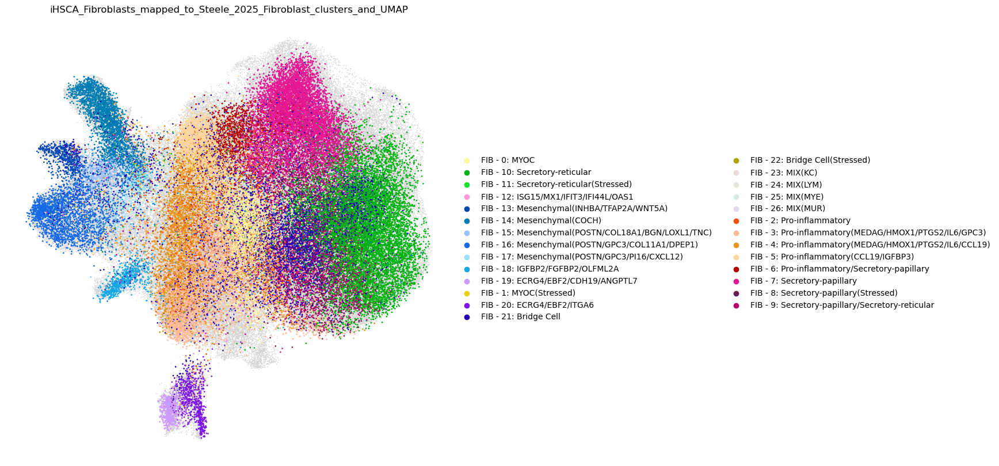

In [13]:
fig, ax = plt.subplots(figsize = (10, 10))
filename = 'iHSCA_Fibroblasts_mapped_to_Steele_2025_Fibroblast_clusters_and_UMAP'
basis = 'UMAP_ingest_SH'
sc.pl.embedding(adata[adata.obs['study_id']=='Steele_Haniffa_2025'], basis = basis, s = 5, ax = ax, show = False, frameon = False)
sc.pl.embedding(adata[adata.obs['study_id']!='Steele_Haniffa_2025'], basis = basis, s = 15, ax = ax, show = False, color = 'integrated_annotation_L2', frameon = False, title = filename, palette = cmap_full)

#[fig.savefig(os.path.join(os.path.join(fig_path, f'{filename}.{f}')), bbox_inches = 'tight', dpi = 600) for f in ['pdf', 'png']]

## Fig S3e

[None, None]

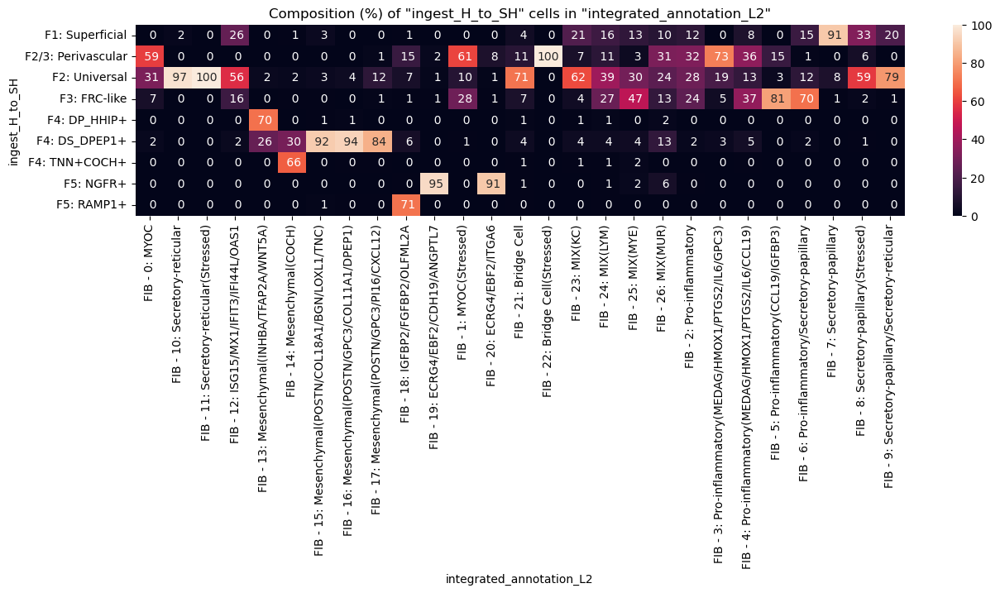

In [379]:
fig, ax = plt.subplots(figsize = (15, 3))
filename = 'iHSCA_Fibroblast_mapping_to_Steele_2025_Fibroblasts_Contribution'
plot_group_composition_heatmap(adata.obs.loc[lambda x: x['study_id'] != 'Steele_Haniffa_2025'], count_group_name ='ingest_H_to_SH', groupby_name ='integrated_annotation_L2', ax = ax, transpose = True)
clear_output()
[fig.savefig(os.path.join(os.path.join(fig_path, f'{filename}.{f}')), bbox_inches = 'tight', dpi = 600) for f in ['pdf', 'png']]

# Check quality

In [98]:
sc.pp.calculate_qc_metrics(adata, layer = 'raw_counts', inplace = True)

## Make low count cluster (21) comparison for steele only

In [12]:
df = steele_data.obs.copy()

In [13]:
df["log1p_counts_mean"] = (
    df["log1p_total_counts"]
    - df.groupby("donor_id_running")["log1p_total_counts"].transform("mean")
)
df["log1p_counts_median"] = (
    df["log1p_total_counts"]
    - df.groupby("donor_id_running")["log1p_total_counts"].transform("median")
)
df["log1p_counts_z"] = (
    df["log1p_total_counts"]
    - df.groupby("study_id")["log1p_total_counts"].transform("mean")
) / df.groupby("study_id")["log1p_total_counts"].transform("std")

In [33]:
remove_clusters = ['KC - IFE - 19: uHF', 'KC - IFE - 23: HF_Anagen', 'KC - IFE - 27: Gland_Channel_2', 'KC - IFE - 21: HF_2', 'KC - IFE - 24: SG_1', 'KC - IFE - 26: Gland_Channel_1', 'KC - IFE - 22: HF_3', 'KC - IFE - 20: HF_1']#, 'IFE - 32: MIX_KC/Imm', 'IFE - 33: MIX_KC/FIB', 'IFE - 34: MIX_KC/vSM', 'IFE - 35: MIX_KC/EC', 'IFE - 31: Melanocytes']
df = df[~df['ingest_SH_to_H'].isin(remove_clusters)].copy()

In [48]:
comparisons = {'FIB': ['FIB - 21']}

In [71]:
from scipy.stats import wilcoxon

x = 'ingest_SH_to_H'
y = 'log1p_total_counts'

wilcoxon_results = {}

for cell, clusters in comparisons.items():
    wilcoxon_results[cell] = {}
    for cluster in clusters:
        cluster = [c for c in df[x].dropna().unique() if c.startswith(cluster + ':')][0]
        effects = []
        
        for donor, sub in df.groupby("sample_id_running"):
            c1 = sub.loc[sub[x] == cluster, y]
            c2 = sub.loc[sub[x] != cluster, y]
            
            if len(c1) > 20 and len(c2) > 20:
                effects.append(c1.median() - c2.median())
        
        wilcoxon_results[cell][cluster] = wilcoxon(effects)

In [72]:
from statsmodels.stats.multitest import multipletests

records = []
for cell, clusters in wilcoxon_results.items():
    for cluster, res in clusters.items():
        records.append({
            "cell": cell,
            "cluster": cluster,
            "statistic": res.statistic,
            "pval": res.pvalue if np.isfinite(res.pvalue) else 1})

df_results = pd.DataFrame(records)

df_results["pval_adj"] = multipletests(df_results["pval"], method="fdr_bh")[1]

for _, row in df_results.iterrows():
    wilcoxon_results[row["cell"]][row["cluster"]] = {
        "statistic": row["statistic"],
        "pval": row["pval"],
        "pval_adj": row["pval_adj"]}
df_results['Significant'] = np.where(df_results['pval_adj'] < 0.05, True, False)

### Fig S3b

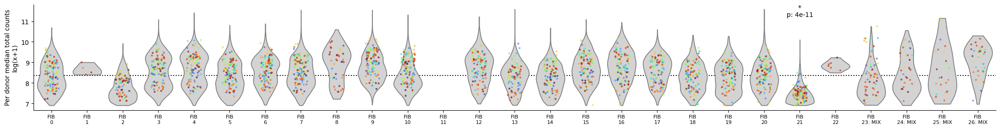

In [73]:
s = 3
type_col = 'Cell_Type'

x = 'ingest_SH_to_H'
y = 'log1p_total_counts'
#cell_type = 'Fibroblast'
for cell_type in natsorted(df[type_col].dropna().unique()):
    tmp_df = df[df[type_col]==cell_type]
    
    #order = natsorted([c for c in tmp_df[x].unique() if c != 'nan'])
    order = natsorted(adata.obs['ingest_SH_to_H'].unique().tolist())
    fig, ax = initialize_subplots(1, ncols = 1, figsize_multiplier = (1*len(order), 3), gridspec_kw = dict(hspace = 0.15), print_help=False)
    
    sbn.violinplot(data = tmp_df, x = x, y = y, ax = ax, cut = 0, density_norm = 'width', order = order, color = 'lightgray', inner = None)
        
    medians_for_plotting = tmp_df.groupby(['sample_id_running', x], observed = True)[y].median().to_frame().reset_index()
    medians_for_plotting['ingest_SH_to_H'] = pd.Categorical(medians_for_plotting['ingest_SH_to_H'], categories=order, ordered = True)
    
    sbn.stripplot(data=medians_for_plotting, x=x, y=y, order=order, dodge=False, jitter=0.2, s=s, hue='sample_id_running', edgecolor=None, linewidth=0, ax=ax, alpha = 0.7, palette = 'turbo')

    ax.legend('', frameon = False)
    ax.axhline(tmp_df[y].mean(), ls = ':', color = 'k', zorder = -10)
        
    ax.set_xticklabels([t.get_text().split(':')[0].replace(' - ', '\n') if 'MIX' not in t.get_text() else t.get_text().split('(')[0].replace(' - ', '\n') for t in ax.get_xticklabels()], rotation = 0, fontsize = 8)
    ax.set_xlabel('')

    [ax.spines[spine].set_visible(False) for spine in ['top', 'right']]

    for _, row in df_results[df_results['cell'] == cell_type].iterrows():
        cl = int(row['cluster'].split(f'{cell_type} - ')[-1].split(':')[0])
        if row['Significant']:
            p = f"{row['pval_adj']:1.0e}"
            sig = '*'
        else:
            p = np.round(row['pval_adj'], decimals=2)
            sig = 'n.s'
        ax.text(cl, ax.get_ylim()[1] * 0.95, s = f'{sig}\np: {p}', ha = 'center')
    [ax.spines[spine].set_visible(False) for spine in ['top', 'right']]
    
    ax.set_ylabel('Per donor median total counts\nlog(x+1)')
    [fig.savefig(os.path.join(fig_path, f'QC_{cell_type}_Steele_total_counts.{f}'), bbox_inches = 'tight', dpi = 600) for f in ['png', 'pdf']]

In [77]:
fig_path

'/mnt/p/users/Hao/iHSCA_manuscript/Figure_items/Embedding_densities/Steele'

In [74]:
from scipy.stats import wilcoxon

x = 'ingest_SH_to_H'
y = 'log1p_n_genes_by_counts'

wilcoxon_results = {}

for cell, clusters in comparisons.items():
    wilcoxon_results[cell] = {}
    for cluster in clusters:
        cluster = [c for c in df[x].dropna().unique() if c.startswith(cluster + ':')][0]
        effects = []
        
        for donor, sub in df.groupby("sample_id_running"):
            c1 = sub.loc[sub[x] == cluster, y]
            c2 = sub.loc[sub[x] != cluster, y]
            
            if len(c1) > 20 and len(c2) > 20:
                effects.append(c1.median() - c2.median())
        
        wilcoxon_results[cell][cluster] = wilcoxon(effects)

In [75]:
from statsmodels.stats.multitest import multipletests

records = []
for cell, clusters in wilcoxon_results.items():
    for cluster, res in clusters.items():
        records.append({
            "cell": cell,
            "cluster": cluster,
            "statistic": res.statistic,
            "pval": res.pvalue if np.isfinite(res.pvalue) else 1})

df_results = pd.DataFrame(records)

df_results["pval_adj"] = multipletests(df_results["pval"], method="fdr_bh")[1]

for _, row in df_results.iterrows():
    wilcoxon_results[row["cell"]][row["cluster"]] = {
        "statistic": row["statistic"],
        "pval": row["pval"],
        "pval_adj": row["pval_adj"]}
df_results['Significant'] = np.where(df_results['pval_adj'] < 0.05, True, False)

### Fig S3b 2

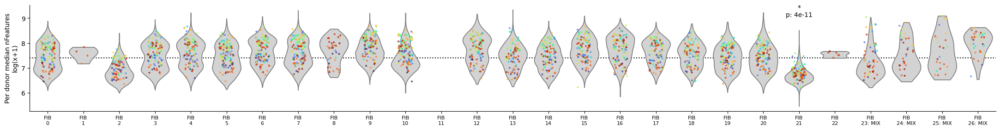

In [76]:
s = 3
type_col = 'Cell_Type'

x = 'ingest_SH_to_H'
y = 'log1p_n_genes_by_counts'
#cell_type = 'Fibroblast'
for cell_type in natsorted(df[type_col].dropna().unique()):
    tmp_df = df[df[type_col]==cell_type]
    
    #order = natsorted([c for c in tmp_df[x].unique() if c != 'nan'])
    order = natsorted(adata.obs['ingest_SH_to_H'].unique().tolist())
    fig, ax = initialize_subplots(1, ncols = 1, figsize_multiplier = (1*len(order), 3), gridspec_kw = dict(hspace = 0.15), print_help=False)
    
    sbn.violinplot(data = tmp_df, x = x, y = y, ax = ax, cut = 0, density_norm = 'width', order = order, color = 'lightgray', inner = None)
        
    medians_for_plotting = tmp_df.groupby(['sample_id_running', x], observed = True)[y].median().to_frame().reset_index()
    medians_for_plotting['ingest_SH_to_H'] = pd.Categorical(medians_for_plotting['ingest_SH_to_H'], categories=order, ordered = True)
    
    sbn.stripplot(data=medians_for_plotting, x=x, y=y, order=order, dodge=False, jitter=0.2, s=s, hue='sample_id_running', edgecolor=None, linewidth=0, ax=ax, alpha = 0.7, palette = 'turbo')

    ax.legend('', frameon = False)
    ax.axhline(tmp_df[y].mean(), ls = ':', color = 'k', zorder = -10)
        
    ax.set_xticklabels([t.get_text().split(':')[0].replace(' - ', '\n') if 'MIX' not in t.get_text() else t.get_text().split('(')[0].replace(' - ', '\n') for t in ax.get_xticklabels()], rotation = 0, fontsize = 8)
    ax.set_xlabel('')

    [ax.spines[spine].set_visible(False) for spine in ['top', 'right']]

    for _, row in df_results[df_results['cell'] == cell_type].iterrows():
        cl = int(row['cluster'].split(f'{cell_type} - ')[-1].split(':')[0])
        if row['Significant']:
            p = f"{row['pval_adj']:1.0e}"
            sig = '*'
        else:
            p = np.round(row['pval_adj'], decimals=2)
            sig = 'n.s'
        ax.text(cl, ax.get_ylim()[1] * 0.95, s = f'{sig}\np: {p}', ha = 'center')
    [ax.spines[spine].set_visible(False) for spine in ['top', 'right']]
    
    ax.set_ylabel('Per donor median nFeatures\nlog(x+1)')
    [fig.savefig(os.path.join(fig_path, f'QC_{cell_type}_Steele_nFeatures.{f}'), bbox_inches = 'tight', dpi = 600) for f in ['png', 'pdf']]

# Save output

In [2]:
path = convert_path(r'P:\IMPORTANT-Backup-Sequencing-Projects\2024_Hao_HSCA_Integration_datasets\Additional_datasets\v70_H_SH')
file = 'adata_all_20260302_Ingest_mapping_Steele_2025.h5ad'
#adata.write_h5ad(os.path.join(path, file))
adata = sc.read_h5ad(os.path.join(path, file))
adata

AnnData object with n_obs × n_vars = 220775 × 36601
    obs: 'study_id', 'experiment_id', 'institute', 'author_batch_notes', 'organism', 'organism_ontology_term_id', 'donor_id', 'donor_id_running', 'sex_ontology_term', 'sex_ontology_term_id', 'ethnicity_1', 'ethnicity_2', 'ethnicity_details', 'self_reported_ethnicity_ontology_term_id', 'genotype', 'age_years', 'age_range', 'development_stage_ontology_term', 'development_stage_ontology_term_id', 'disease', 'disease_ontology_term_id', 'disease_status', 'treatment_status', 'smoking_status', 'smoking_history', 'bmi', 'systemic_disorder', 'autoimmune_component', 'menopause_status', 'puperty_status', 'sun_exposure', 'skin_tone', 'skin_care', 'manner_of_death', 'sample_id', 'sample_id_running', 'sample_source', 'sample_collection_method', 'sampled_site_condition', 'anatomical_region_level_1', 'anatomical_region_level_2', 'anatomical_region_level_3', 'anatomical_region', 'tissue_type', 'tissue_free_text', 'tissue_ontology_term', 'tissue_ontolo

In [4]:
steele_data = adata[adata.obs['study_id']=='Steele_Haniffa_2025'].copy()
steele_data.obsm['X_umap'] = steele_data.obsm['UMAP_ingest_H'].copy()

In [6]:
sc.tl.embedding_density(steele_data, groupby = 'ingest_SH_to_H')
sc.tl.embedding_density(steele_data, groupby = 'cell_type')

In [8]:
fig_path = '/mnt/p/users/Hao/iHSCA_manuscript/Figure_items/Embedding_densities/Steele'
if not os.path.exists(fig_path):
    os.mkdir(fig_path)

## Fig 3e

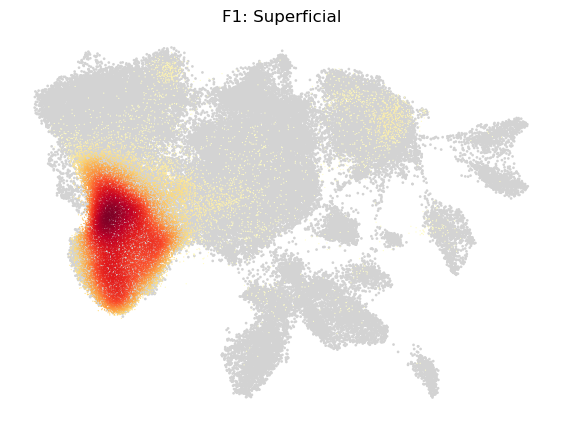

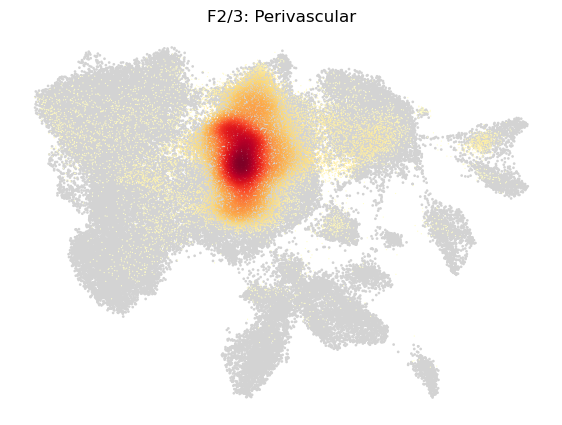

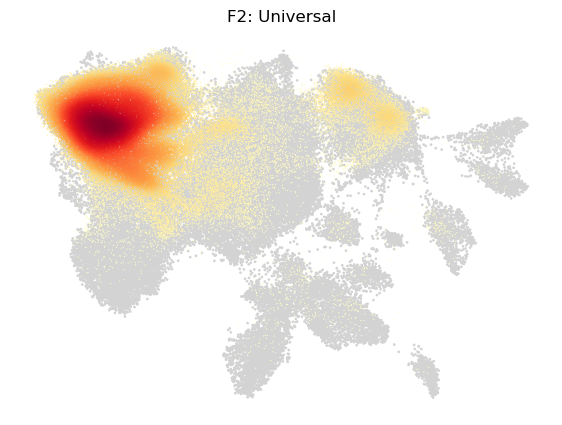

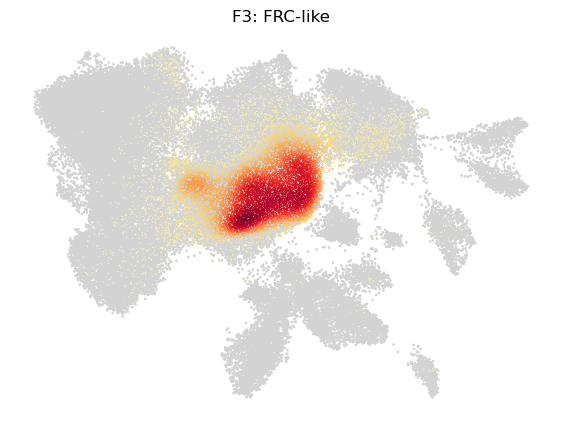

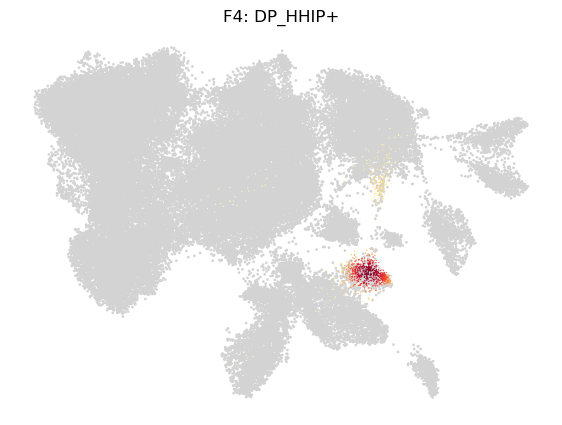

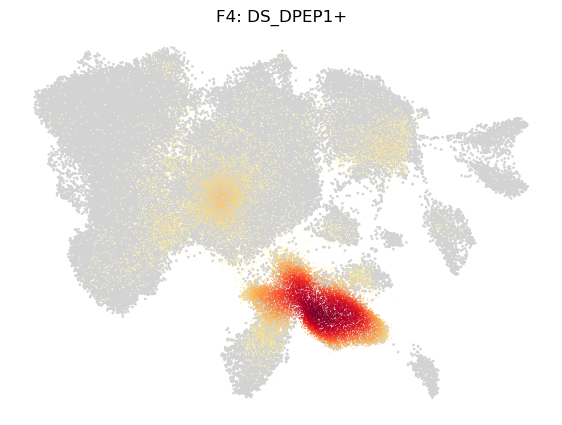

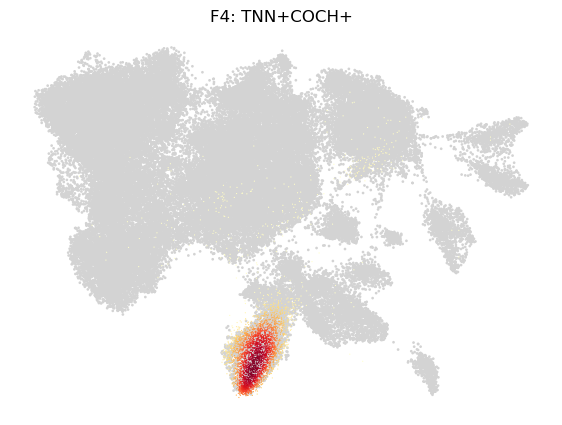

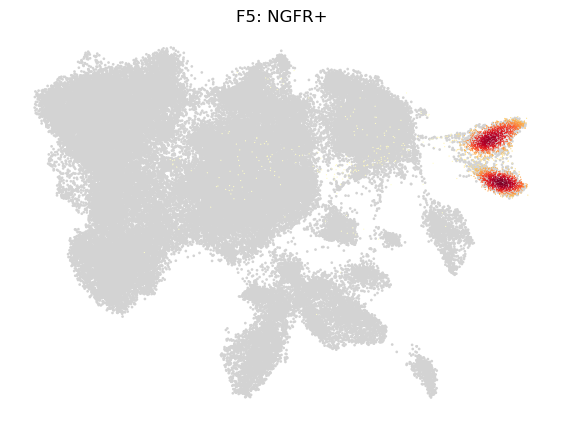

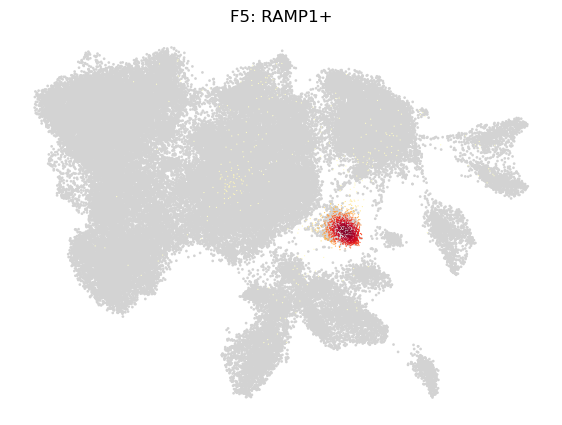

In [10]:
basis = 'UMAP_ingest_H'
cluster_name = 'cell_type'
clusters = natsorted(adata.obs[cluster_name].unique())
clusters = [cl for cl in clusters if isinstance(cl, str)]

for ix, cl in enumerate(clusters):
    #ax = axes.flatten()[ix]
    fig, ax = plt.subplots(figsize = (7, 5))
    sc.pl.embedding(adata[adata.obs['study_id']!='Steele_Haniffa_2025'], basis = basis, s = 15, ax = ax, show = False, frameon = False)
    sc.pl.embedding(steele_data[steele_data.obs[cluster_name] == cl], basis = basis, s = 3, ax = ax, show = False, color = f'umap_density_{cluster_name}', title = cl, cmap = 'YlOrRd', legend_loc = None, colorbar_loc = None)

    filename = f'Steele_2025_Fibroblasts_mapped_to_iHSCA_data_embedding_density_Steele_cluster_names_{cl.replace('/', '-')}'
    [fig.savefig(os.path.join(os.path.join(fig_path, f'{filename}.{f}')), bbox_inches = 'tight', dpi = 600) for f in ['pdf', 'png']]
    